In [44]:
import numpy as np
import torch, os
import matplotlib.pyplot as plt

device = 'cuda:7' if torch.cuda.is_available() else 'cpu'


In [45]:
from hyper_sl.utils import data_process

In [46]:
def load_occ(i):
        """
        bring occlusion map

        input i-th scene occlusion map

        return occlusion map in tensor type

        """
        cam_H, cam_W = 580, 890
        output_dir = "/workspace/Scalable-Hyperspectral-3D-Imaging/dataset/data/result_np"
        occlusion = np.load(os.path.join(output_dir, "scene_%04d_Occlusion.npy" %(i))).astype(np.float32)
        occlusion = data_process.crop(occlusion)
        occlusion = torch.tensor(occlusion)
        occlusion = occlusion.reshape(cam_H*cam_W,3)

        # threshold
        mask_0 = (occlusion[:,:] <= 0.8)  #  0.5보다 작은 숫자들 즉, true 인 곳에 0을 넣기
        mask_1 = (occlusion[:,:] > 0.8)

        occ = np.ma.array(occlusion, mask=mask_0)
        occ = occ.filled(fill_value=0.0)

        occ = np.ma.array(occ, mask=mask_1)
        occ = occ.filled(fill_value=1.0)

        occ = occ.reshape(cam_H, cam_W,3)
        occ = occ[...,0]
        occ = torch.tensor(occ)

        return occ

In [72]:
occ = load_occ(1)

In [22]:
# set dimensions
R, C = 890, 580  # width, height
N = 40  # number of illumination patterns
W = 25  # number of wavelengths
M = R * C  # number of total elements in A and B

# R, C = 640, 640  # width, height
# N = 42  # number of illumination patterns
# W = 29  # number of wavelengths
# M = R * C  # number of total elements in A and B

In [69]:
pred_hyp = np.load('/workspace/Scalable-Hyperspectral-3D-Imaging/prediction/prediction_hyp_1530.npy')

In [70]:
pred_hyp = pred_hyp.reshape(C,R,W)

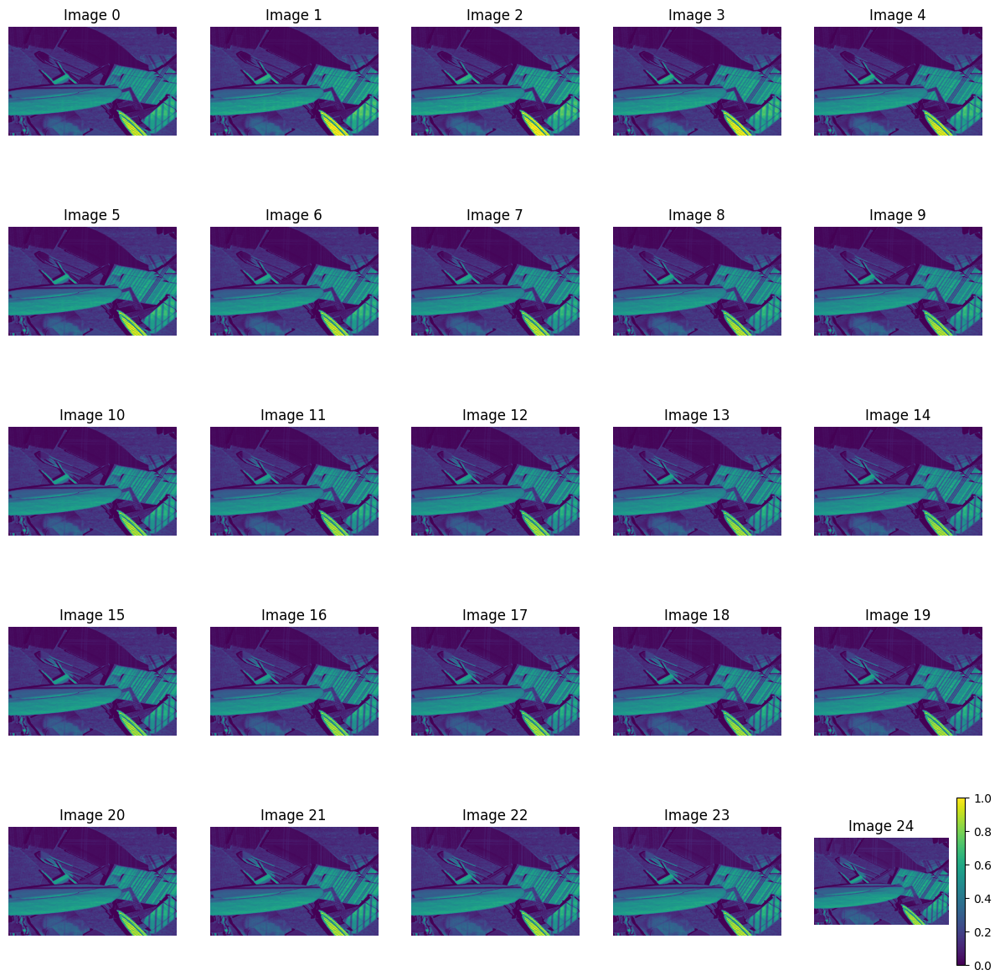

In [71]:
max_images_per_column = 5
num_columns = (W + max_images_per_column - 1) // max_images_per_column
plt.figure(figsize=(15, 3*num_columns))

for c in range(num_columns):
    start_index = c * max_images_per_column
    end_index = min(start_index + max_images_per_column, W)
    num_images = end_index - start_index
    
    for i in range(num_images):
        plt.subplot(num_columns, num_images, i + c * num_images + 1)
        plt.imshow(pred_hyp[:, :, i + start_index], vmin=0, vmax=1)
        plt.axis('off')
        plt.title(f"Image {i + start_index}")
        
        if i + start_index == W - 1:
            plt.colorbar()

In [73]:
gt_hyp = np.load('/workspace/Scalable-Hyperspectral-3D-Imaging/prediction/ground_truth_hyp_1530.npy')

In [74]:
gt_hyp = gt_hyp.reshape(C,R,W)

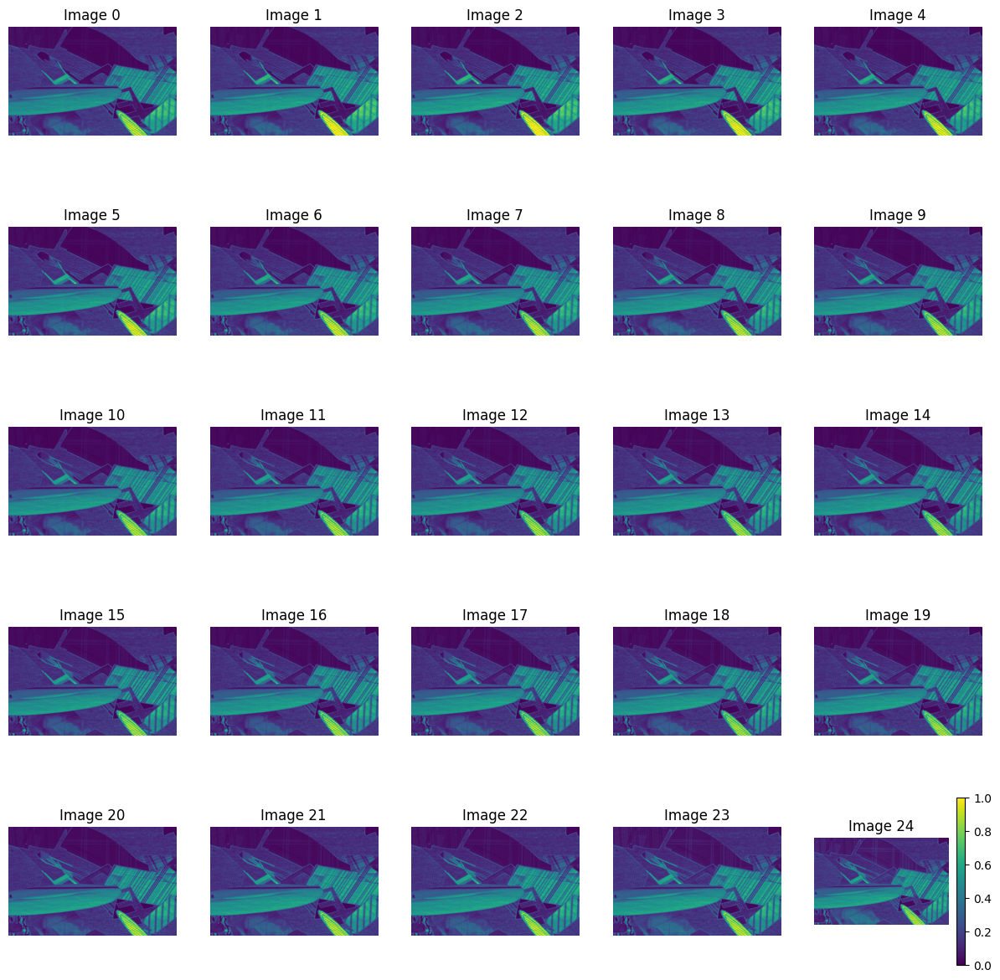

In [75]:
max_images_per_column = 5
num_columns = (W + max_images_per_column - 1) // max_images_per_column
plt.figure(figsize=(15, 3*num_columns))

for c in range(num_columns):
    start_index = c * max_images_per_column
    end_index = min(start_index + max_images_per_column, W)
    num_images = end_index - start_index
    
    for i in range(num_images):
        plt.subplot(num_columns, num_images, i + c * num_images + 1)
        plt.imshow(gt_hyp[:, :, i + start_index], vmin=0, vmax=1)
        plt.axis('off')
        plt.title(f"Image {i + start_index}")
        
        if i + start_index == W - 1:
            plt.colorbar()

In [76]:
diff = abs(pred_hyp- gt_hyp)*occ.unsqueeze(dim = 2).numpy()

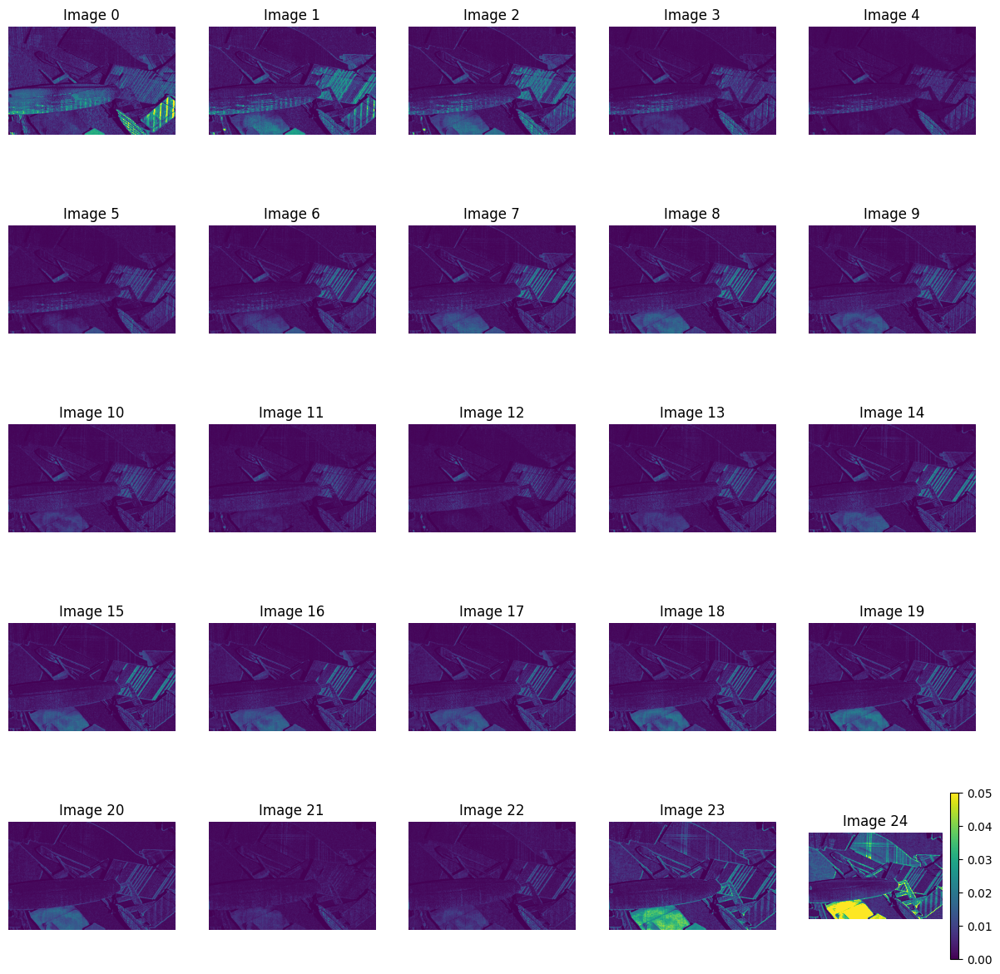

In [78]:
max_images_per_column = 5
num_columns = (W + max_images_per_column - 1) // max_images_per_column
plt.figure(figsize=(15, 3*num_columns))

for c in range(num_columns):
    start_index = c * max_images_per_column
    end_index = min(start_index + max_images_per_column, W)
    num_images = end_index - start_index
    
    for i in range(num_images):
        plt.subplot(num_columns, num_images, i + c * num_images + 1)
        plt.imshow(diff[:, :, i + start_index], vmin=0, vmax=0.05)
        plt.axis('off')
        plt.title(f"Image {i + start_index}")
        
        if i + start_index == W - 1:
            plt.colorbar()

In [ ]:
end

## Check with x_gt

In [ ]:
A = torch.tensor(np.load('/home/shshin/Scalable-Hyperspectral-3D-Imaging/A.npy'))
b = torch.tensor(np.load('/home/shshin/Scalable-Hyperspectral-3D-Imaging/I.npy'))
x_gt = torch.tensor(np.load('/home/shshin/Scalable-Hyperspectral-3D-Imaging/x_gt.npy'))

In [ ]:
x_gt = x_gt.reshape(580,890,25)

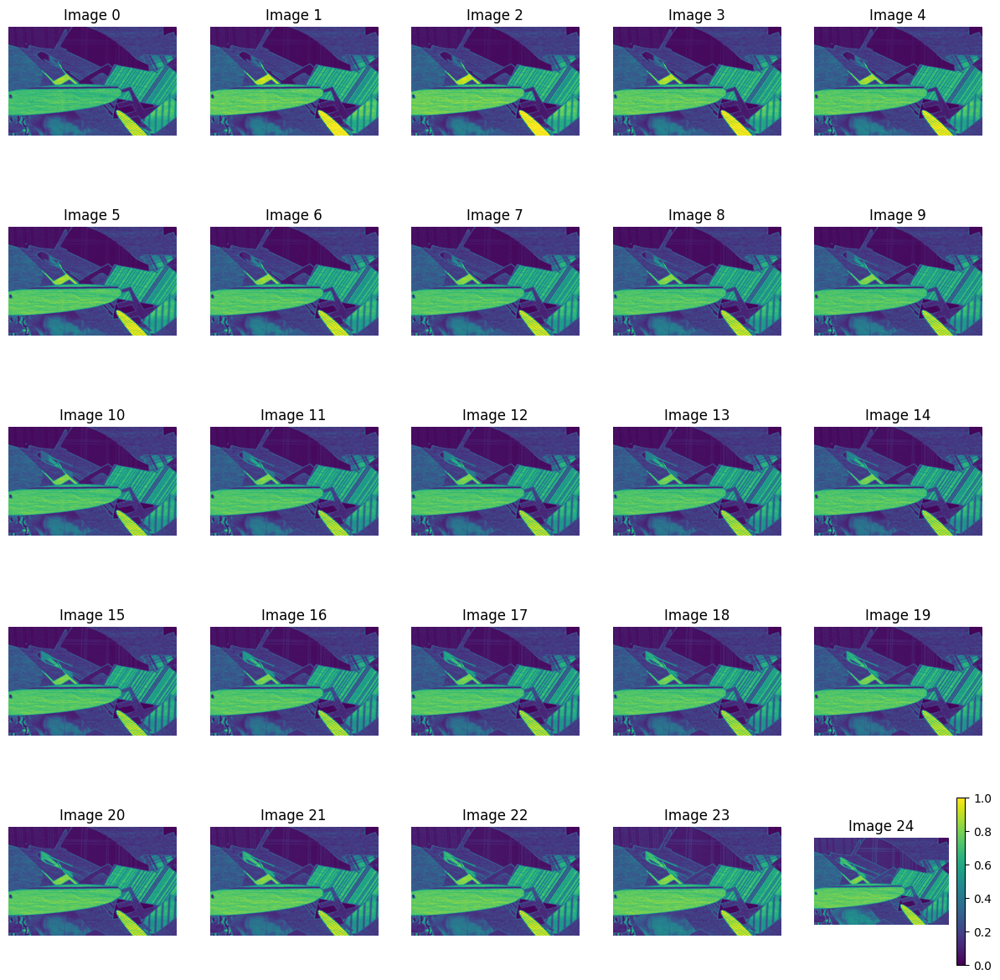

In [ ]:
max_images_per_column = 5
num_columns = (W + max_images_per_column - 1) // max_images_per_column
plt.figure(figsize=(15, 3*num_columns))

for c in range(num_columns):
    start_index = c * max_images_per_column
    end_index = min(start_index + max_images_per_column, W)
    num_images = end_index - start_index
    
    for i in range(num_images):
        plt.subplot(num_columns, num_images, i + c * num_images + 1)
        plt.imshow(x_gt[:, :, i + start_index], vmin=0, vmax=1)
        plt.axis('off')
        plt.title(f"Image {i + start_index}")
        
        if i + start_index == W - 1:
            plt.colorbar()

/home/shshin/.conda/envs/hyper3d/lib/python3.7/site-packages/ipykernel_launcher.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  This is separate from the ipykernel package so we can avoid doing imports until


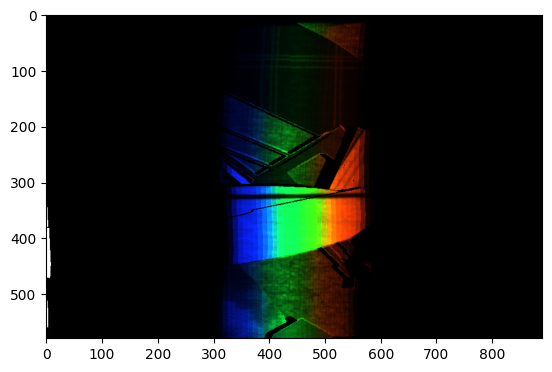

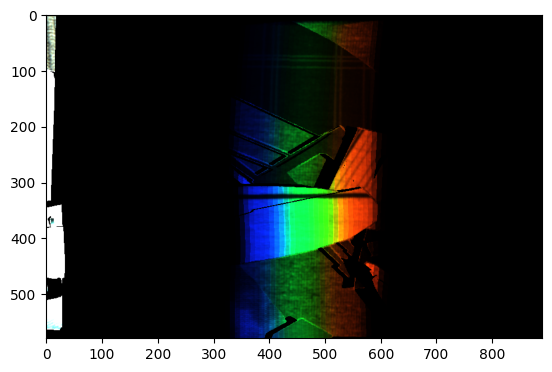

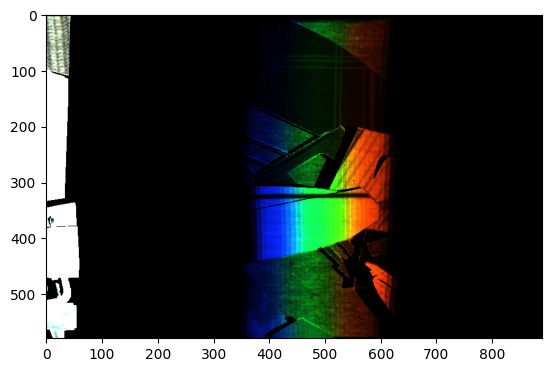

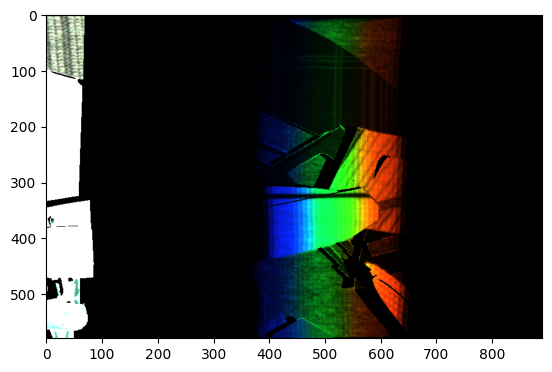

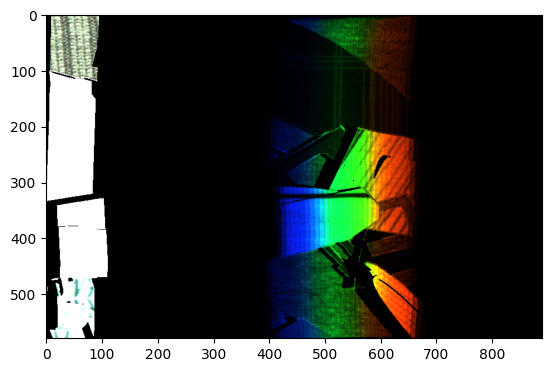

...

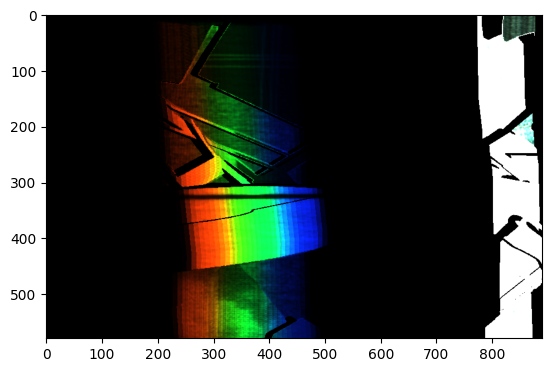

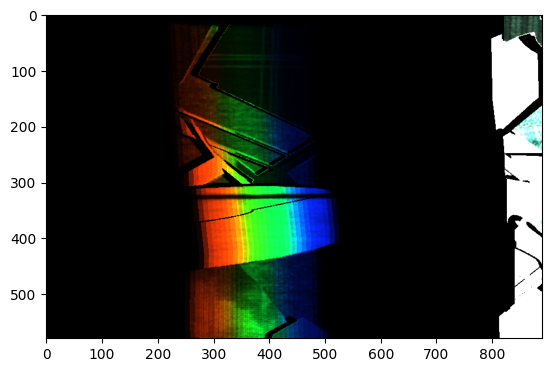

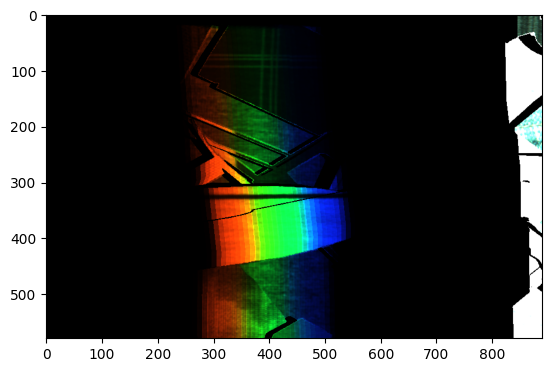

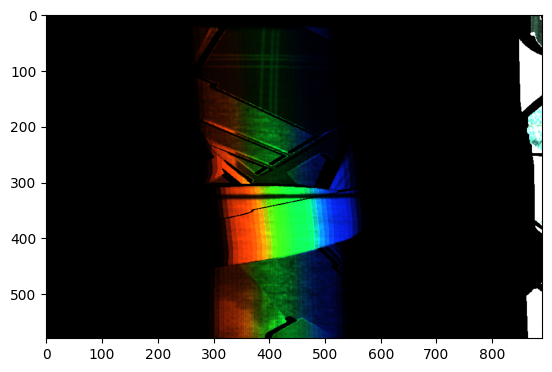

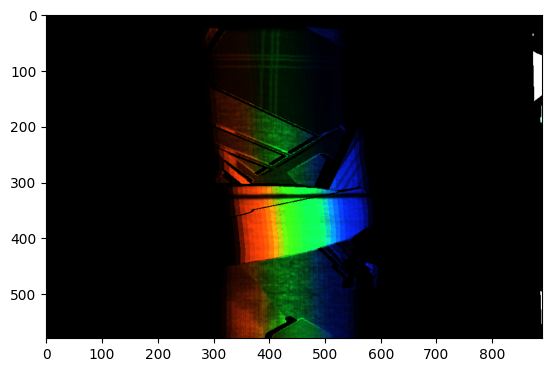

In [ ]:
b_reshape = b.reshape(C, R, N, 3)
for i in range(N):
    plt.figure()
    plt.imshow(b_reshape[:,:,i,:])

In [ ]:
import os, cv2
from hyper_sl.utils import data_process
img_hyp_text_path = "/home/shshin/Scalable-Hyperspectral-3D-Imaging/dataset/image_formation/img_hyp_text"

def load_hyp_img(i):
        """"
        bring hyperspectral reflectance array
        
        """
        img_list = sorted(os.listdir(img_hyp_text_path))
        img_choice = img_list[i]
        
        hyp_img = np.load(os.path.join(img_hyp_text_path, img_choice)).astype(np.float32)
        hyp_img = cv2.resize(hyp_img, (1024, 768))
        hyp_img = hyp_img[...,2:27]
        hyp_img = data_process.crop(hyp_img)

        hyp_img = torch.tensor(hyp_img)
        
        return hyp_img

gt = load_hyp_img(0)

In [ ]:
x_gt = x_gt.reshape(580,890,25)

In [ ]:
x_gt.shape, A.shape, b.shape 
# A * x_gt = b 
# b : B, # pixel, N*3
b = b.reshape(-1,3*N)
x_gt = x_gt.reshape(-1, 25)

In [ ]:
b = b.flatten()
idx = torch.where(b > 0.95)

b[idx] = 0

A = A.reshape(-1, W)
A[idx] = 0

In [ ]:
x_gt.shape, A.shape, b.shape 
# A * x_gt = b 
# b : B, # pixel, N*3
b = b.reshape(-1,3*N)
x_gt = x_gt.reshape(-1, 25)

In [ ]:
A = A.reshape(C*R, 3*N, W)

In [ ]:
idx = 890 * 290 + 445
A = A[idx]
x_gt = x_gt[idx]
b = b[idx]

In [ ]:
gt = gt.reshape(-1,25)
gt = gt[idx]

In [ ]:
list_A = list(A.unsqueeze(dim =0))
# list_A = list(A)
block = torch.block_diag(*list_A)

In [ ]:
block.shape, b.shape, len(list_A)

(torch.Size([120, 25]), torch.Size([120]), 1)

In [ ]:
# x_sol = torch.linalg.lstsq(block, b.flatten(), driver='gelsy')
x_sol = torch.linalg.lstsq(block, b.unsqueeze(1), driver='gelsy')

x = x_sol.solution

In [ ]:
block.shape, b.shape

(torch.Size([120, 25]), torch.Size([120]))

In [ ]:
b_est = A@x

In [ ]:
b_est.shape

torch.Size([120, 1])

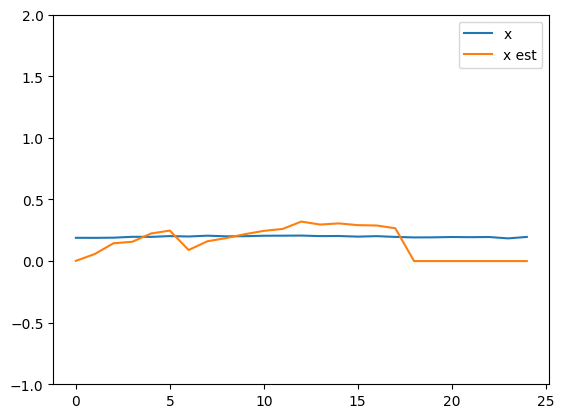

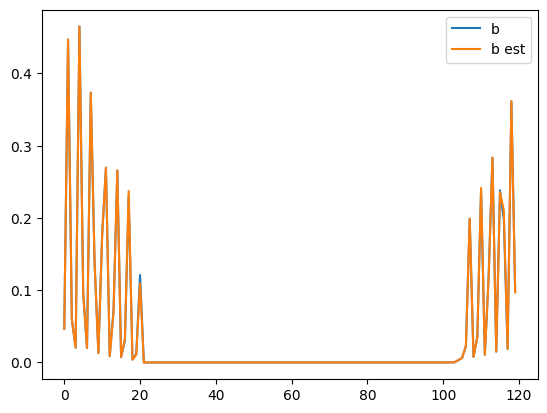

In [ ]:
plt.figure()
plt.plot(x_gt)
plt.plot(x)
plt.legend(['x', 'x est'])
plt.ylim([-1, 2])

plt.figure()
plt.plot(b)
plt.plot(b_est)
plt.legend(['b', 'b est'])

In [ ]:
end

NameError: name 'df' is not defined

## Compare

In [ ]:
A = np.load('/home/shshin/Scalable-Hyperspectral-3D-Imaging/A.npy')
b = np.load('/home/shshin/Scalable-Hyperspectral-3D-Imaging/I.npy')

A_prev = np.load('/home/shshin/Scalable-Hyperspectral-3D-Imaging/AandI/A.npy')
b_prev = np.load('/home/shshin/Scalable-Hyperspectral-3D-Imaging/AandI/I.npy')

In [ ]:
b.shape, b_prev.shape

((61944000, 1), (51609600, 1))

In [ ]:
b.shape

(61944000, 1)

In [ ]:
A_reshape, A_prev_reshape = A.reshape(C, R, N, 3, W), A_prev.reshape(640, 640, 42, 3, 29)
b_reshape, b_prev_reshape = b.reshape(C, R, N, 3), b_prev.reshape(640, 640, 42, 3)

In [ ]:
for i in range(N):
    plt.figure()
    plt.imshow(b_reshape[:,:,i,:])

In [ ]:
for i in range(25):
    plt.figure()
    plt.imshow(A_reshape[:,:,10,:,i])

In [ ]:
import matplotlib.pyplot as plt

n_illum = 1
n_wvl = 0

fig = plt.figure(figsize=(15,5))


plt.subplot(121), plt.imshow(A_reshape[:,:,n_illum,:,n_wvl]*30), plt.colorbar()
plt.subplot(122), plt.imshow(A_prev_reshape[:,:,n_illum,:,n_wvl]*1000), plt.colorbar()

In [ ]:
n_illum = 1
n_wvl = 0

fig = plt.figure(figsize=(15,5))
plt.subplot(121), plt.imshow(b_reshape[:,:,n_illum,:]), plt.colorbar()
plt.subplot(122), plt.imshow(b_prev_reshape[:,:,n_illum,:]*10), plt.colorbar()

In [ ]:
A.shape

(516200, 120, 25)

In [ ]:
C, R

(580, 890)

In [ ]:
load_dat = True
if load_dat:
    A = np.load('/home/shshin/Scalable-Hyperspectral-3D-Imaging/A.npy')
    b = np.load('/home/shshin/Scalable-Hyperspectral-3D-Imaging/I.npy')

    # A = np.load('/home/shshin/Scalable-Hyperspectral-3D-Imaging/AandI/A.npy')
    # b = np.load('/home/shshin/Scalable-Hyperspectral-3D-Imaging/AandI/I.npy')
    b = b.flatten()
    idx = np.where(b > 0.95)

    b[idx] = 0

    A = A.reshape(-1, W)
    A[idx] = 0

    A = A.reshape(C, R, 1, 3*N, W)
    b = b.reshape(C, R, 1, 3*N, 1)
    
    A1 = A[:290,:445]
    A2 = A[:290,445:]
    A3 = A[290:,:445]
    A4 = A[290:,445:]
    
    b1 = b[:290,:445]
    b2 = b[:290,445:]
    b3 = b[290:,:445]
    b4 = b[290:,445:]
    
    A_list = [A1,A2,A3,A4]
    b_list = [b1,b2,b3,b4]
    
    
else:
    # create PyTorch tensors for A and B
    A = np.random.randn(R*C, 1, 3*N, W).astype(np.float32)
    X_gt = np.random.randn(R*C, 1, W, 1).astype(np.float32)

    b = A @ X_gt

In [ ]:
r, c = 290, 445

In [ ]:
A.shape, b.shape

((580, 890, 1, 120, 25), (580, 890, 1, 120, 1))

In [ ]:
def total_variation_loss_l2(img, weight): 
    bs_img, c_img, h_img, w_img = img.size() 
    tv_h = torch.pow(img[:,:,1:,:]-img[:,:,:-1,:], 2).sum() 
    tv_w = torch.pow(img[:,:,:,1:]-img[:,:,:,:-1], 2).sum() 
    return weight*(tv_h+tv_w)/(bs_img*c_img*h_img*w_img)

In [ ]:
def total_variation_loss_l1(img, weight): 
    bs_img, c_img, h_img, w_img = img.size() 
    tv_h = torch.abs(img[:,:,1:,:]-img[:,:,:-1,:]).sum() 
    tv_w = torch.abs(img[:,:,:,1:]-img[:,:,:,:-1]).sum() 
    return weight*(tv_h+tv_w)/(bs_img*c_img*h_img*w_img)

In [ ]:
def total_variation_loss_l2_spectrum(img, weight): 
    bs_img, c_img, h_img, w_img = img.size() 
    tv_s = torch.pow(img[:,1:,:,:]-img[:,:-1,:,:], 2).sum()
    return weight*(tv_s)/(bs_img*c_img*h_img*w_img)

In [ ]:
batch_size = 200000
num_iter = 5000
num_batches = int(np.ceil(M / batch_size))
loss_f = torch.nn.L1Loss()
losses = []
X_np_all = torch.zeros(C, R, 1, W, 1)

# define initial learning rate and decay step
lr = 1
decay_step = 500


# A = A.reshape(C, R, 1, 3*N, W)
# b = b.reshape(C, R, 1, 3*N, 1)

# training loop over batches
for batch_idx in range(4):
    # start_idx = batch_idx * batch_size
    # end_idx = min((batch_idx + 1) * batch_size, M)
    # batch_size_ = end_idx - start_idx
    A_batch = torch.from_numpy(A_list[batch_idx]).to(device).reshape(r*c,1, 3*N, W)
    B_batch = torch.from_numpy(b_list[batch_idx]).to(device).reshape(r*c,1, 3*N, 1)
    X_est = torch.randn(r*c, 1, W, 1, requires_grad=True, device=device)
    optimizer = torch.optim.Adam([X_est], lr=lr)
    scheduler = torch.optim.lr_scheduler.StepLR(optimizer, step_size=decay_step, gamma=0.5)

    optimizer.zero_grad()
    for i in range(num_iter):
        loss = loss_f(A_batch @ X_est, B_batch)
        X_est_reshape = X_est.reshape(r,c,W).unsqueeze(dim = 0).permute(0,3,1,2)
        loss_tv = total_variation_loss_l1(X_est_reshape, 0.1)
        loss_spec = total_variation_loss_l2_spectrum(X_est_reshape, 0.1)
        total_loss = loss + loss_tv + loss_spec
        
        total_loss.backward()
        losses.append(total_loss.item())
        optimizer.step()
        scheduler.step()
        optimizer.zero_grad()

        if i % 100 == 0:
            print(f"Batch {batch_idx + 1}/{num_batches}, Iteration {i}/{num_iter}, Loss: {loss.item()}, TV Loss: {loss_tv.item()}, Spec Loss: {loss_spec.item()},  LR: {optimizer.param_groups[0]['lr']}")

    # X_np_all[start_idx:end_idx] = X_est.detach().cpu()
    
    if batch_idx == 0:
        X_np_all[:290,:445]= X_est.detach().cpu().reshape(r,c,1,W,1)
    elif batch_idx == 1:
        X_np_all[:290,445:]= X_est.detach().cpu().reshape(r,c,1,W,1)
    elif batch_idx == 2:
        X_np_all[290:,:445]= X_est.detach().cpu().reshape(r,c,1,W,1)
    else:
        X_np_all[290:,445:]= X_est.detach().cpu().reshape(r,c,1,W,1)

X_np_all = X_np_all.numpy()

Batch 1/3, Iteration 0/5000, Loss: 0.09172604978084564, TV Loss: 0.22490660846233368, Spec Loss: 0.19166621565818787,  LR: 1
Batch 1/3, Iteration 100/5000, Loss: 0.016198527067899704, TV Loss: 0.020126037299633026, Spec Loss: 0.0013219936517998576,  LR: 1
Batch 1/3, Iteration 200/5000, Loss: 0.016304560005664825, TV Loss: 0.020539596676826477, Spec Loss: 0.0013616285286843777,  LR: 1
Batch 1/3, Iteration 300/5000, Loss: 0.016345838084816933, TV Loss: 0.02068449929356575, Spec Loss: 0.0013758264249190688,  LR: 1
Batch 1/3, Iteration 400/5000, Loss: 0.016343431547284126, TV Loss: 0.020725945010781288, Spec Loss: 0.0013797660358250141,  LR: 1
Batch 1/3, Iteration 500/5000, Loss: 0.016358472406864166, TV Loss: 0.020776906982064247, Spec Loss: 0.0013828870141878724,  LR: 0.5
Batch 1/3, Iteration 600/5000, Loss: 0.013729147613048553, TV Loss: 0.010852483101189137, Spec Loss: 0.0005304857040755451,  LR: 0.5
Batch 1/3, Iteration 700/5000, Loss: 0.01375957764685154, TV Loss: 0.01097732968628406

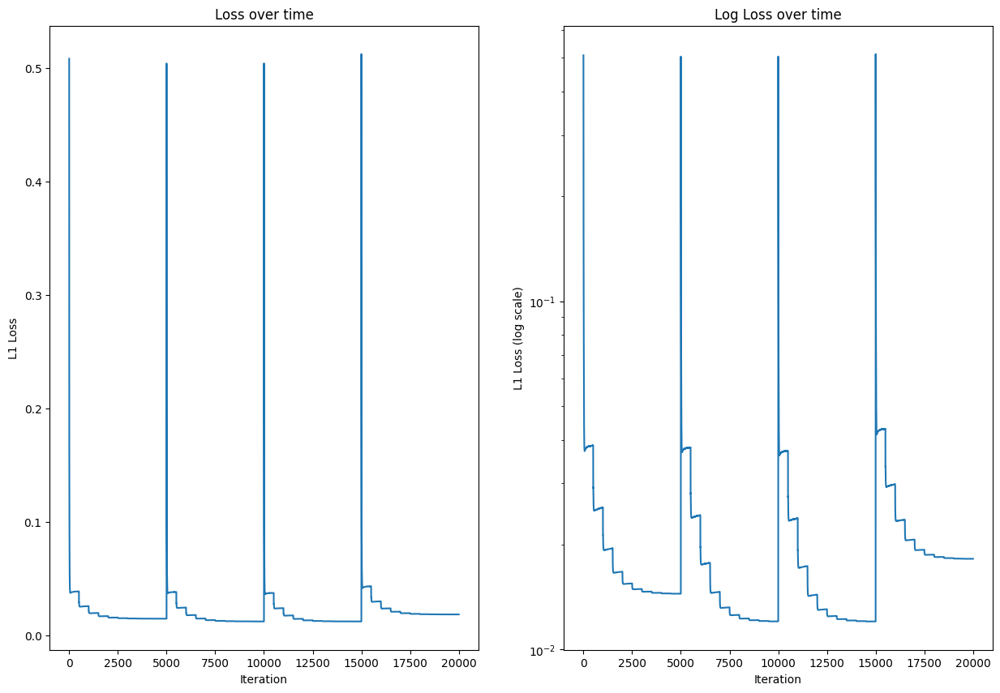

In [ ]:
# plot losses over time
plt.figure(figsize=(15,10))

plt.subplot(1, 2, 1)
plt.plot(losses)
plt.title("Loss over time")
plt.xlabel("Iteration")
plt.ylabel("L1 Loss")

plt.subplot(1, 2, 2)
plt.semilogy(losses)
plt.title("Log Loss over time")
plt.xlabel("Iteration")
plt.ylabel("L1 Loss (log scale)")

plt.show()


In [ ]:
X_np_all = X_np_all.reshape(C,R,W)

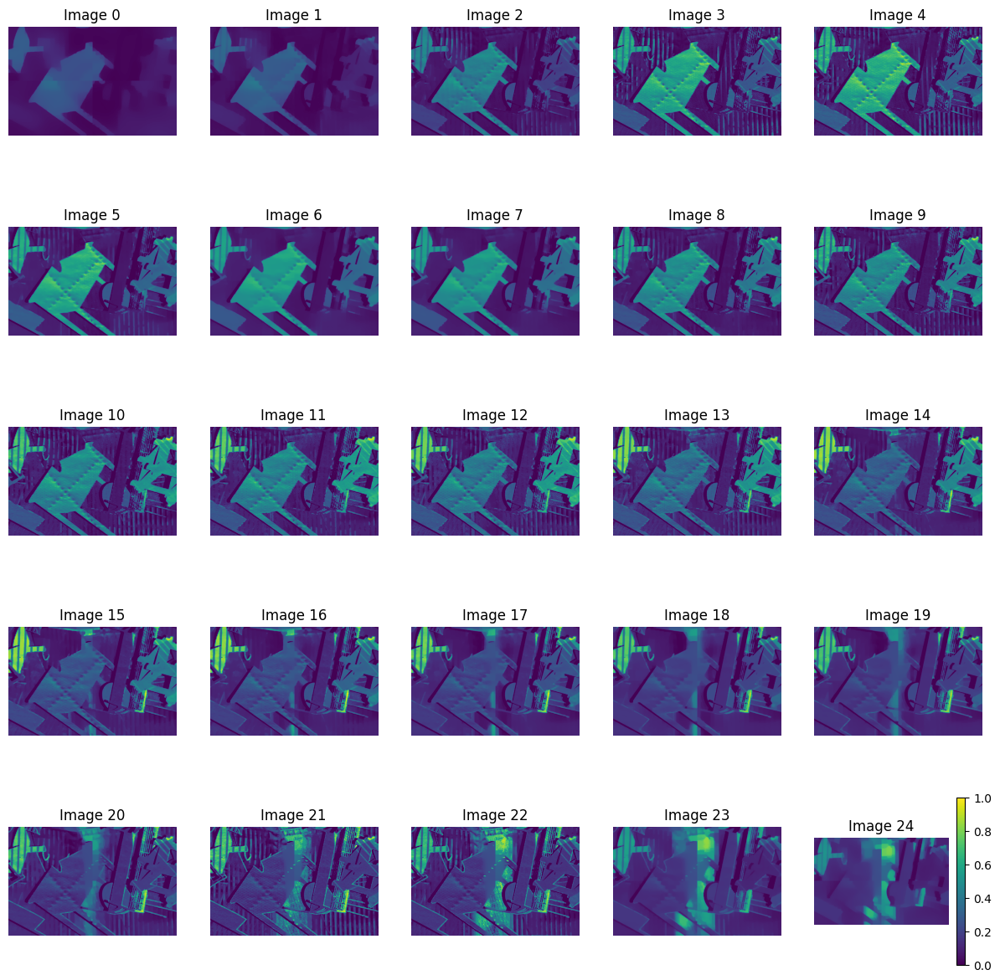

In [ ]:
max_images_per_column = 5
num_columns = (W + max_images_per_column - 1) // max_images_per_column
plt.figure(figsize=(15, 3*num_columns))

for c in range(num_columns):
    start_index = c * max_images_per_column
    end_index = min(start_index + max_images_per_column, W)
    num_images = end_index - start_index
    
    for i in range(num_images):
        plt.subplot(num_columns, num_images, i + c * num_images + 1)
        plt.imshow(X_np_all[:, :, i + start_index], vmin=0, vmax=1)
        plt.axis('off')
        plt.title(f"Image {i + start_index}")
        
        if i + start_index == W - 1:
            plt.colorbar()

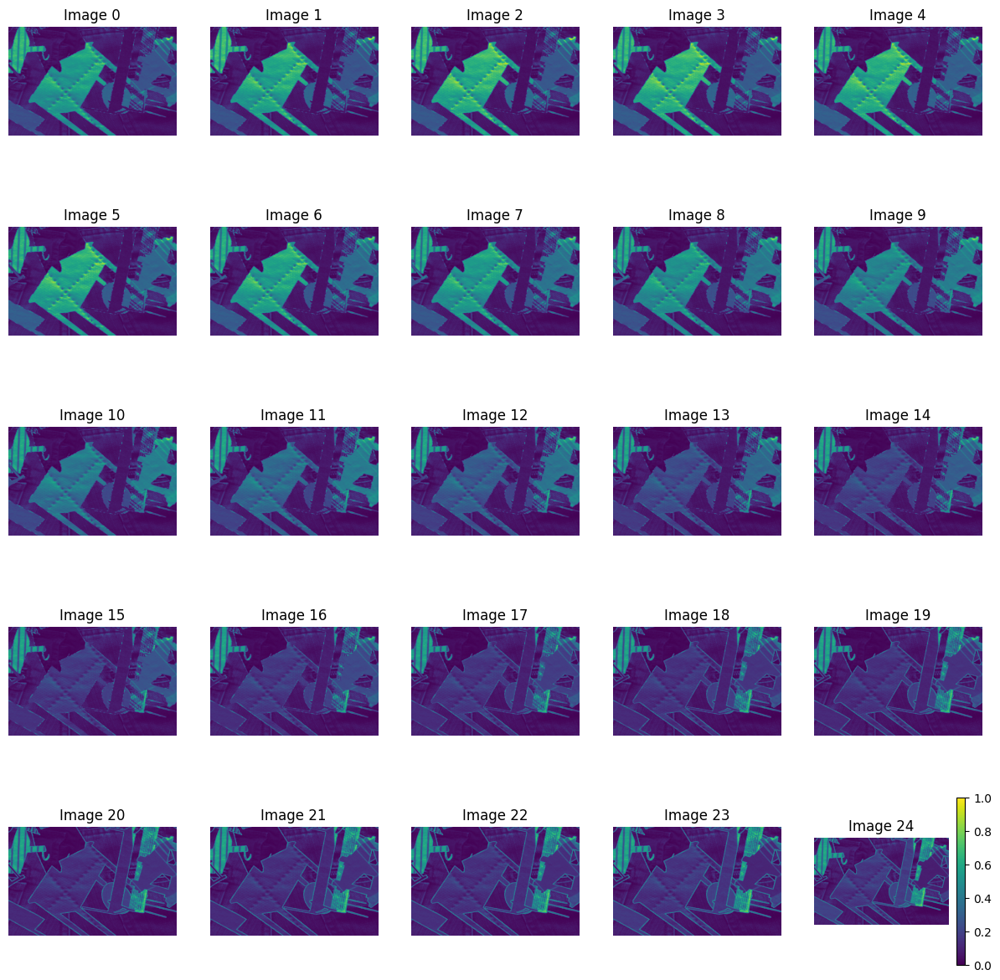

In [ ]:
max_images_per_column = 5
num_columns = (W + max_images_per_column - 1) // max_images_per_column
plt.figure(figsize=(15, 3*num_columns))

for c in range(num_columns):
    start_index = c * max_images_per_column
    end_index = min(start_index + max_images_per_column, W)
    num_images = end_index - start_index
    
    for i in range(num_images):
        plt.subplot(num_columns, num_images, i + c * num_images + 1)
        plt.imshow(gt[:, :, i + start_index], vmin=0, vmax=1)
        plt.axis('off')
        plt.title(f"Image {i + start_index}")
        
        if i + start_index == W - 1:
            plt.colorbar()

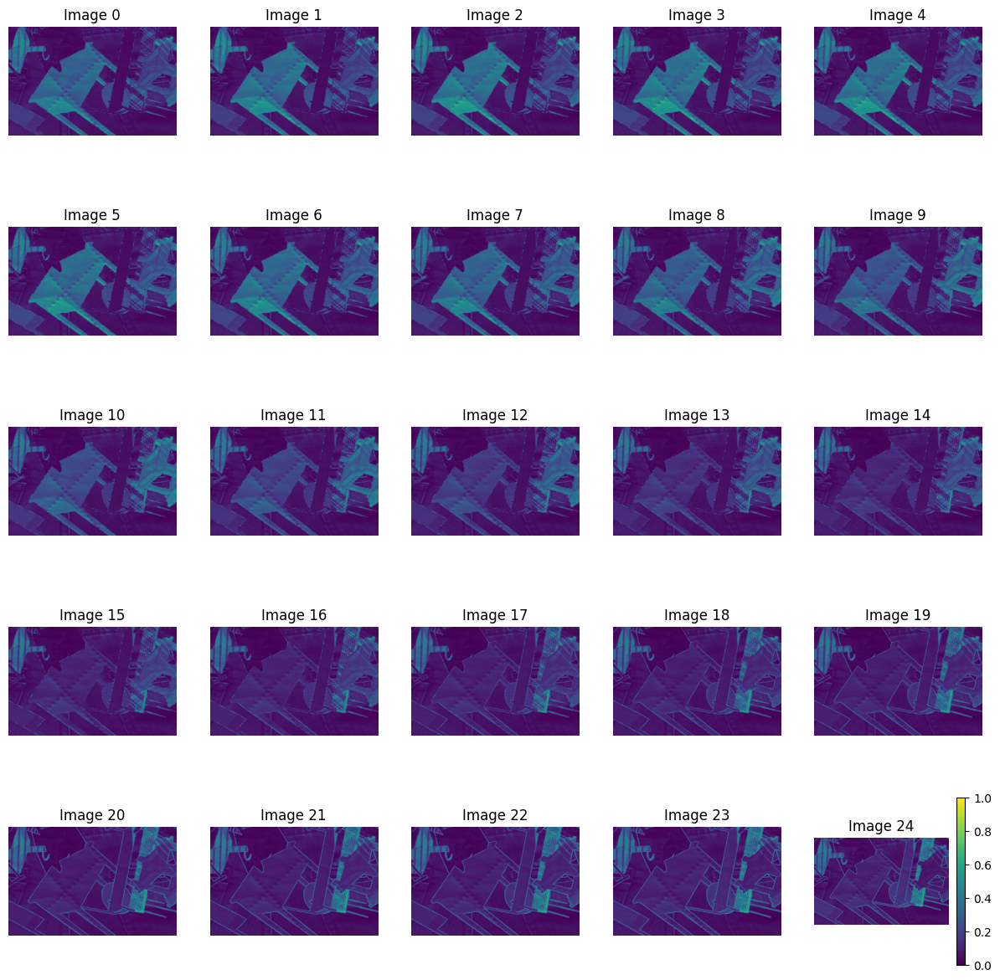

In [ ]:
max_images_per_column = 5
num_columns = (W + max_images_per_column - 1) // max_images_per_column
plt.figure(figsize=(15, 3*num_columns))

for c in range(num_columns):
    start_index = c * max_images_per_column
    end_index = min(start_index + max_images_per_column, W)
    num_images = end_index - start_index
    
    for i in range(num_images):
        plt.subplot(num_columns, num_images, i + c * num_images + 1)
        plt.imshow(x_gt[:, :, i + start_index], vmin=0, vmax=1)
        plt.axis('off')
        plt.title(f"Image {i + start_index}")
        
        if i + start_index == W - 1:
            plt.colorbar()

In [ ]:
diff = abs(x_gt - gt.numpy())

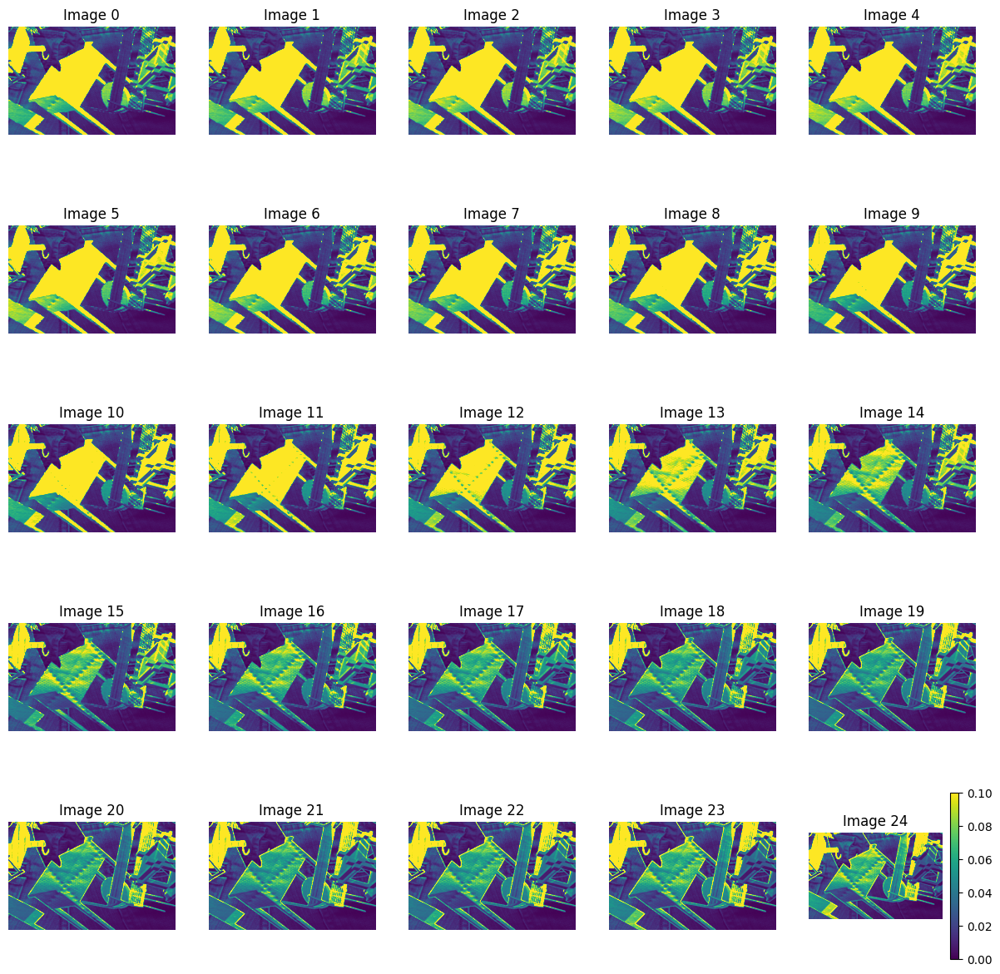

In [ ]:
max_images_per_column = 5
num_columns = (W + max_images_per_column - 1) // max_images_per_column
plt.figure(figsize=(15, 3*num_columns))

for c in range(num_columns):
    start_index = c * max_images_per_column
    end_index = min(start_index + max_images_per_column, W)
    num_images = end_index - start_index
    
    for i in range(num_images):
        plt.subplot(num_columns, num_images, i + c * num_images + 1)
        plt.imshow(diff[:, :, i + start_index], vmin=0, vmax=0.1)
        plt.axis('off')
        plt.title(f"Image {i + start_index}")
        
        if i + start_index == W - 1:
            plt.colorbar()